# **Analyse Datenempfang der tinkerforge-Sensoren**
___

In [1]:
import datetime as dt
import os

import locale
locale.setlocale(locale.LC_ALL,'de_DE')
from zoneinfo import ZoneInfo
tz = ZoneInfo('Europe/Berlin')

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use(".\src\stylesheets\eb3.mplstyle")

from src.project_definitions import BUID, WOHNUNGEN
from src.sensor_reader import import_data
from src.update_databases import up

### update database ###
up()

#### Messdaten Import
print('Starte Import der Datensätze - das kann etwas dauern...')
IND, AMB, EM = import_data(startdate=None)
print('...Import beendet')

ex = False

30.03.2022 16:42:08 -- INFO -- ------ Starte TinkerForge Update------
30.03.2022 16:42:08 -- INFO -- MH wurde übersprungen.
30.03.2022 16:42:08 -- INFO -- MW wurde übersprungen.
30.03.2022 16:42:08 -- INFO -- LB wurde übersprungen.
30.03.2022 16:42:08 -- INFO -- PM wurde übersprungen.
30.03.2022 16:42:08 -- INFO -- WD wurde übersprungen.
30.03.2022 16:42:08 -- INFO -- ------TinkerForge Update beendet!------
30.03.2022 16:42:08 -- INFO -- Molline-Datenbank up-to-date. Kein Update notwendig.


Starte Import der Datensätze - das kann etwas dauern...
...Import beendet


## **1. MOLLINE**
___


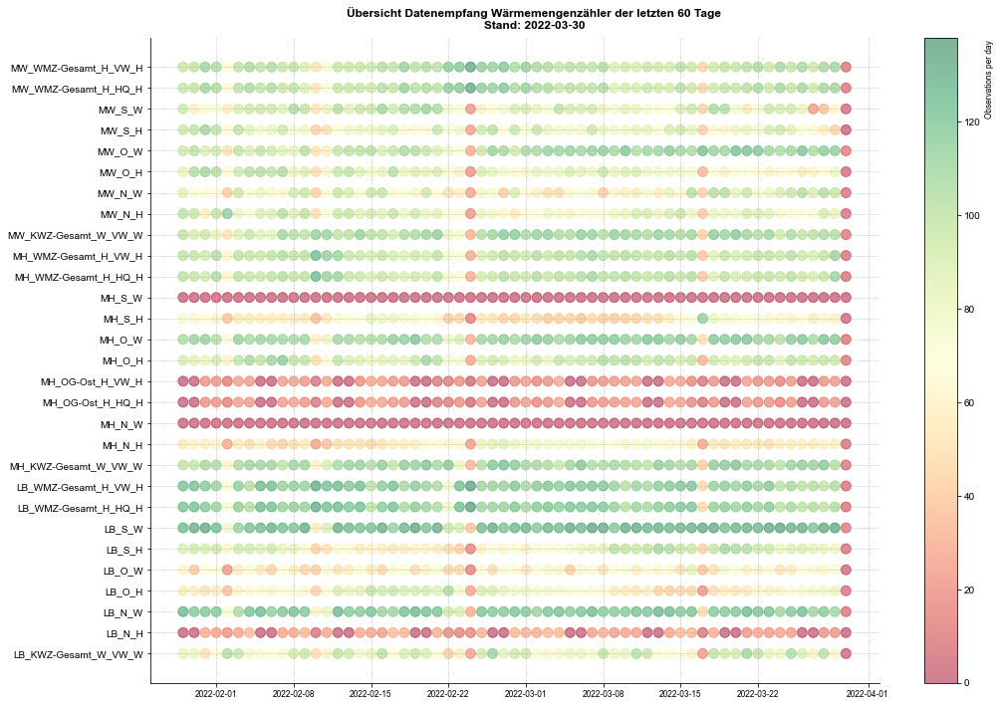

In [2]:
df = EM.resample('10T').last().resample('D').count().droplevel(axis=1, level=2)
df = df.loc[:,~df.columns.duplicated()]
df.columns = ['_'.join(col).strip() for col in df.columns.values]
df = df.unstack().reset_index(level=0)
df.columns = ['meter', 'n_obs']
df = df.sort_index()
df = df.sort_values('meter')
df = df[df.index > df.sort_index().index.max()-dt.timedelta(60)]

f, ax = plt.subplots(figsize=(15,10))
sc = ax.scatter(x=df.index, y=df.meter, s=100, c=df.n_obs,cmap='RdYlGn',alpha=0.5)
cbar = f.colorbar(sc)
cbar.set_label("Observations per day ", loc='top')
timemax = max([EM.index.max().date() for bui in BUID])
f.suptitle(f'Übersicht Datenempfang Wärmemengenzähler der letzten 60 Tage\nStand: {timemax}')
f.tight_layout()

## **2. TINKERFORGE**
____


### Detaillierte Übersicht über die letzten 60 Tage

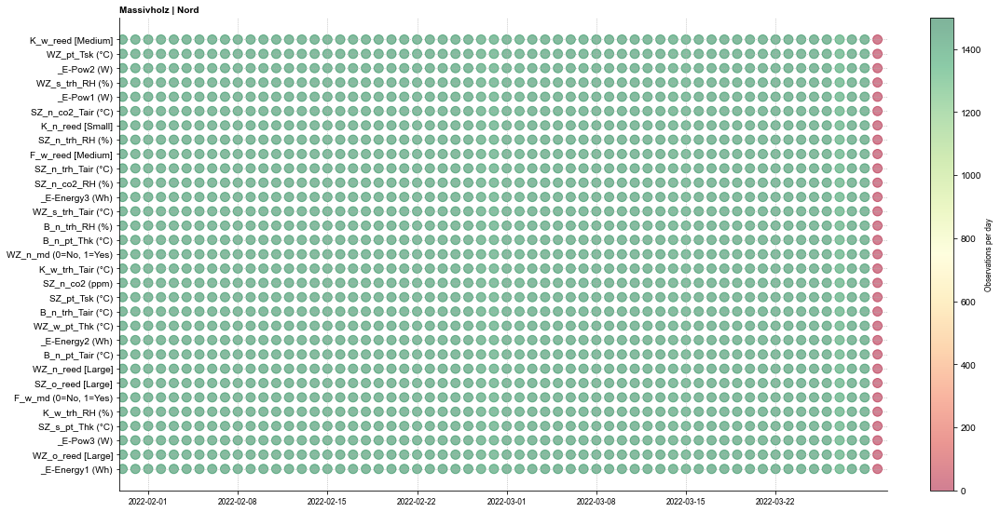

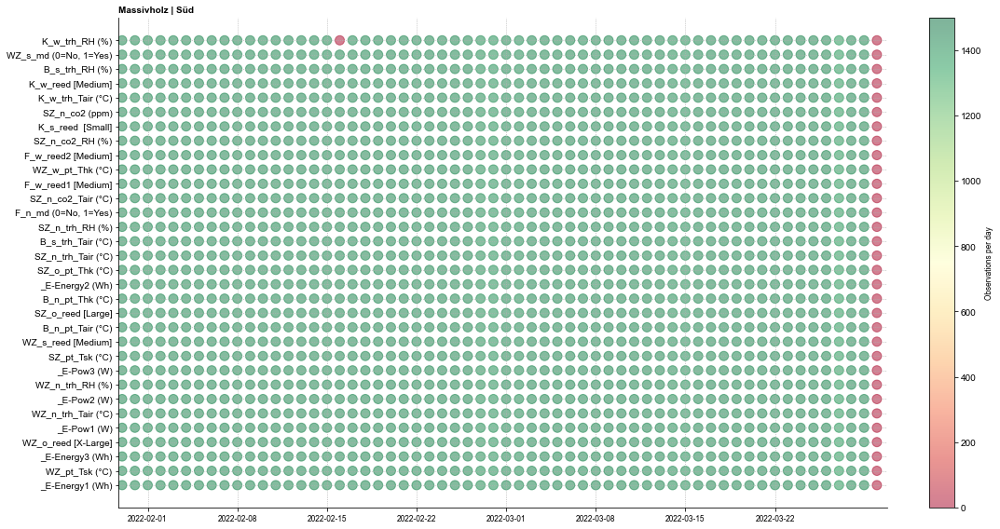

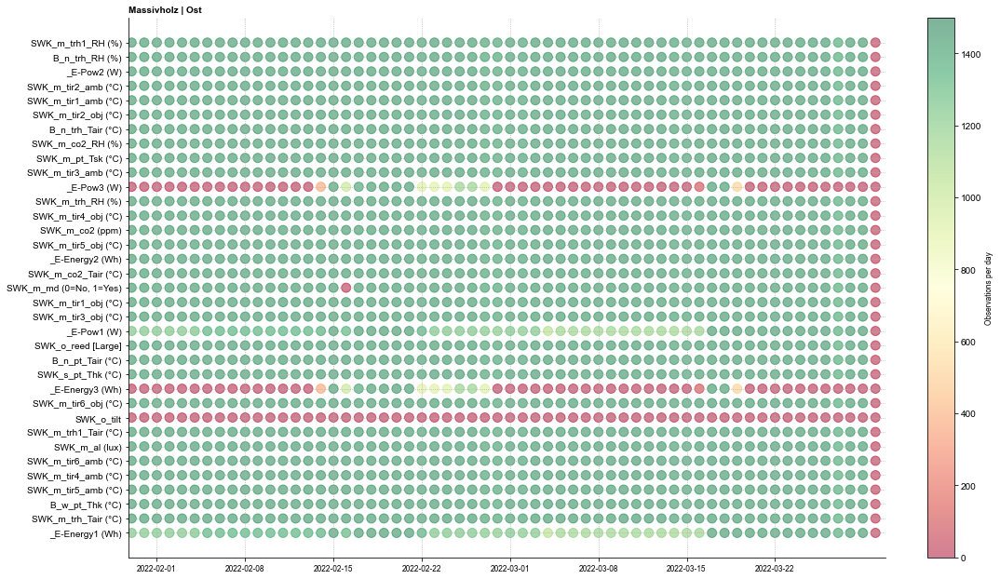

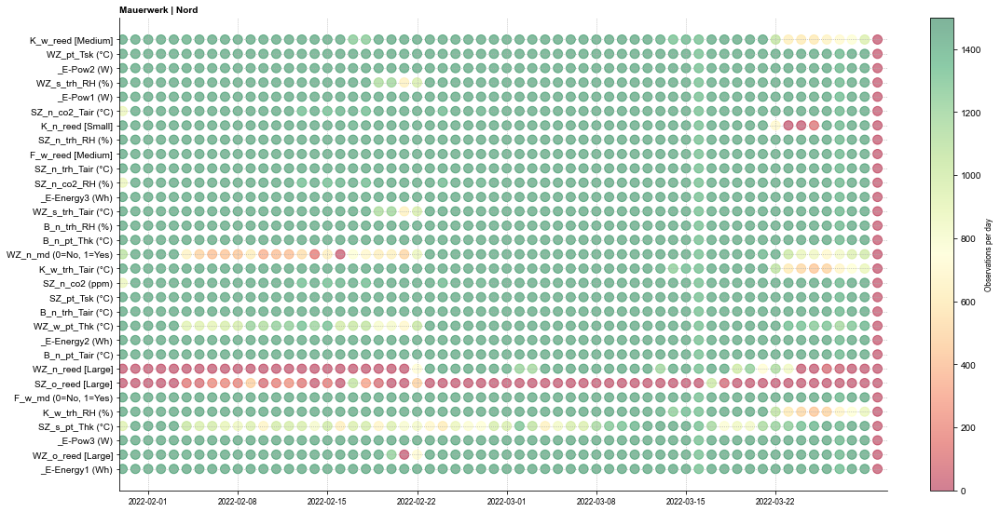

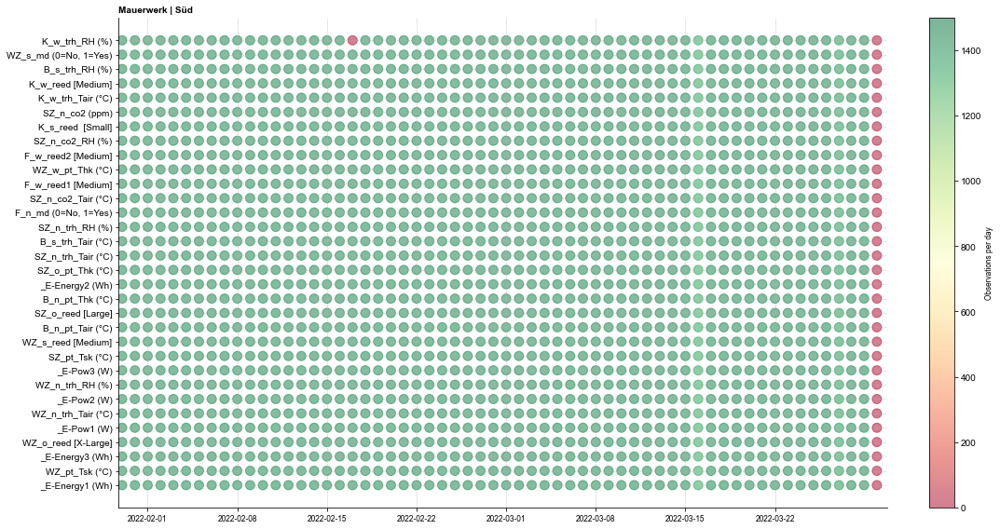

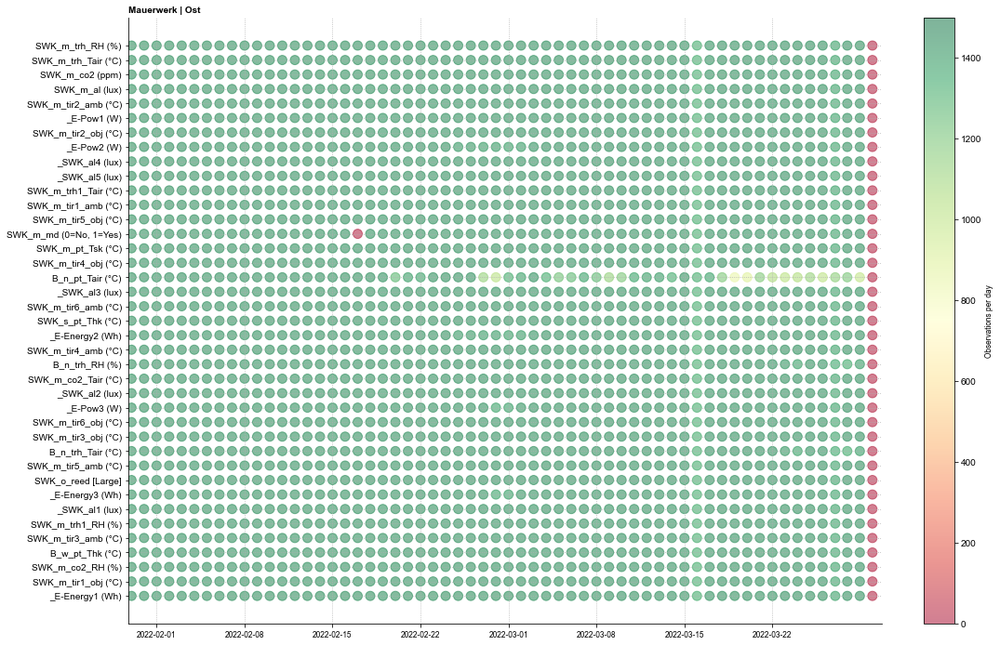

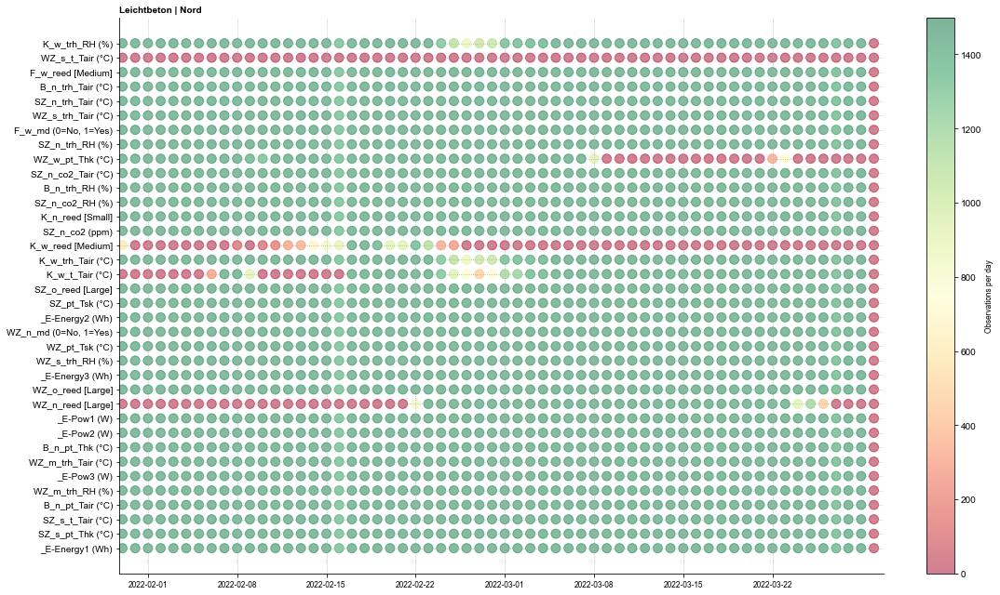

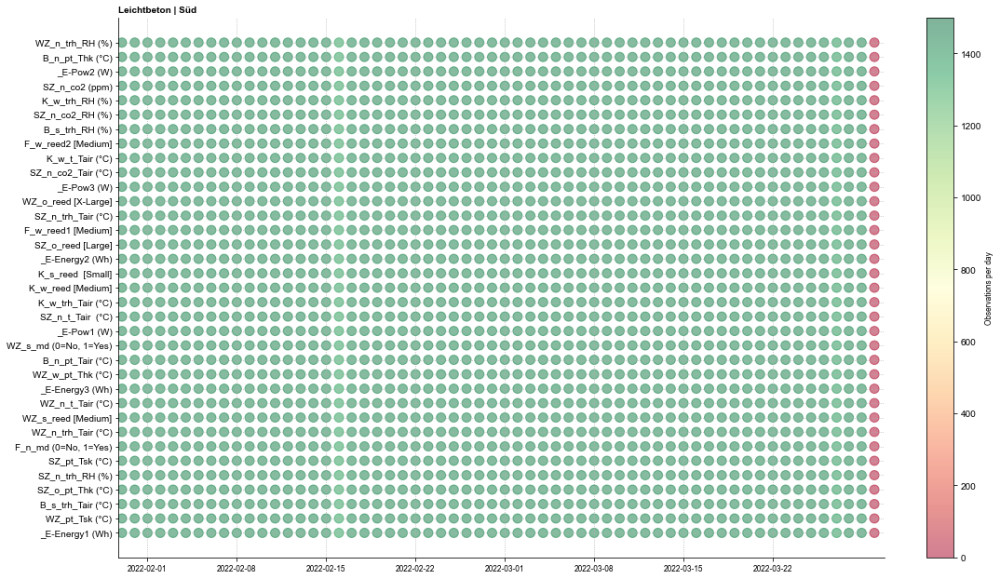

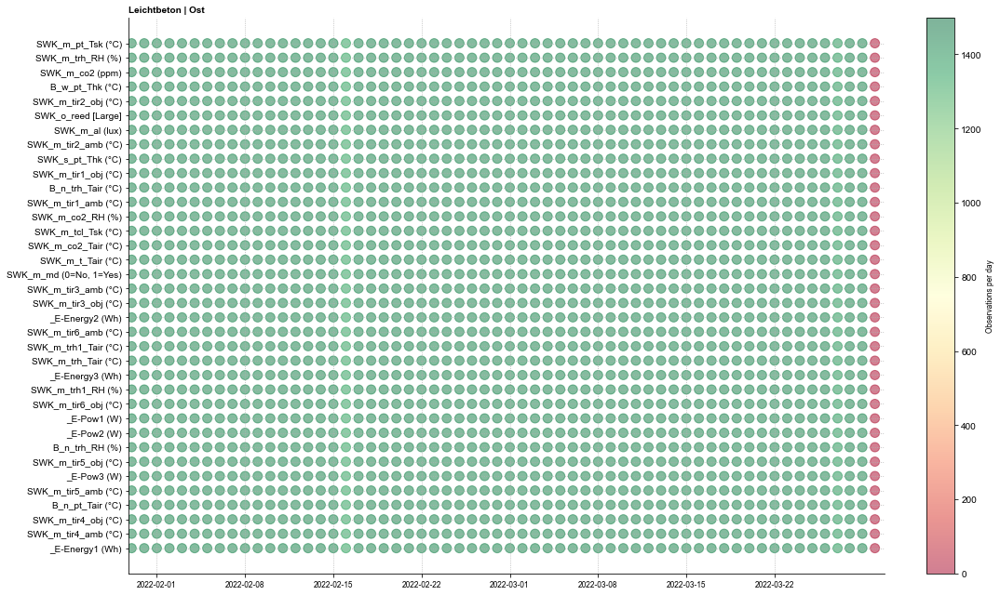

In [3]:
for bui in BUID:
    for app in WOHNUNGEN:
        fig,ax = plt.subplots(figsize=(15,10))
        ax.set_title(f'{BUID[bui]} | {WOHNUNGEN[app]}')
        df = IND[bui][app].resample('D').count()
        df.columns = ['_'.join(col).strip() for col in df.columns.values]
        df = df.unstack().reset_index(level=0)
        df.columns = ['Sensor_ID', 'n_data']
        df.sort_index(inplace=True)
        fig.set_figheight(df.Sensor_ID.unique().size*0.25)
        sc = ax.scatter(df.index, df.Sensor_ID, c=df.n_data, s=100, alpha=0.5, marker = 'o', cmap='RdYlGn')
        ax.set_xlim(dt.datetime.now()-dt.timedelta(60),dt.datetime.now())
        cbar = fig.colorbar(sc,fraction=.05)
        cbar.set_label("Observations per day")
        fig.tight_layout()

## Datenempfang gesamt

C:\Users\Roman\AppData\Local\Temp/ipykernel_20904/383076572.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize = (10,10))


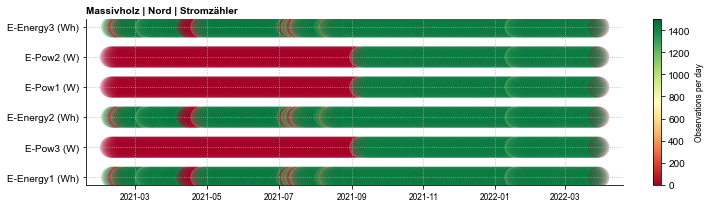

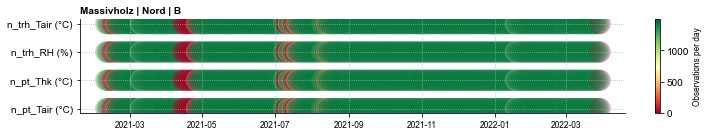

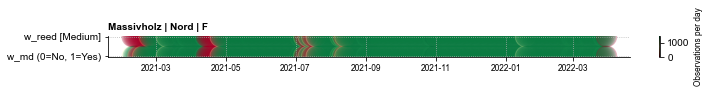

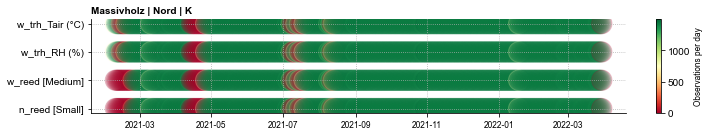

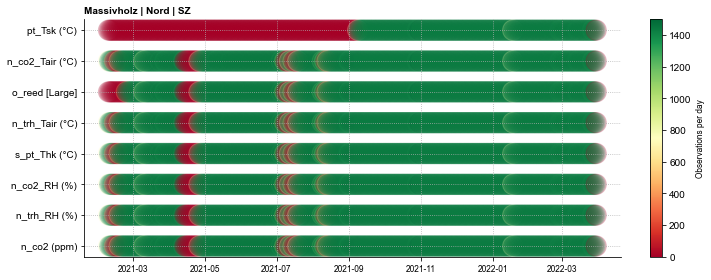

...

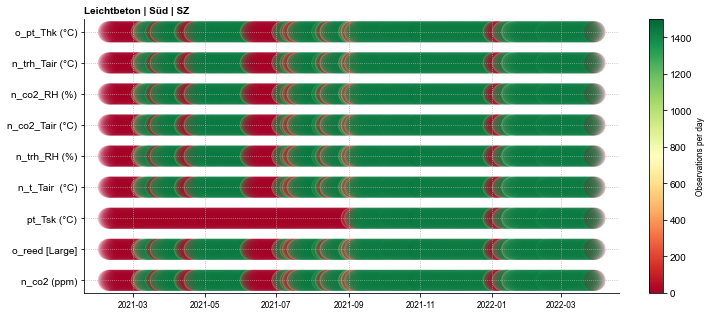

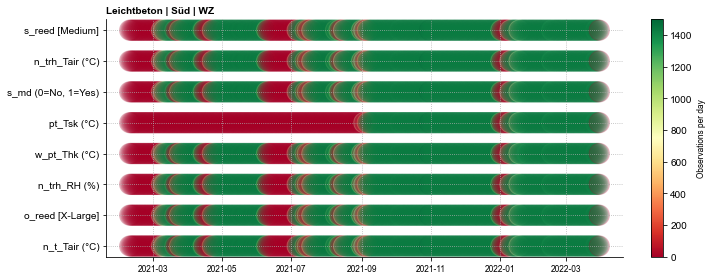

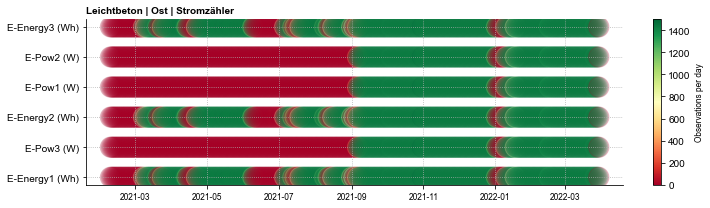

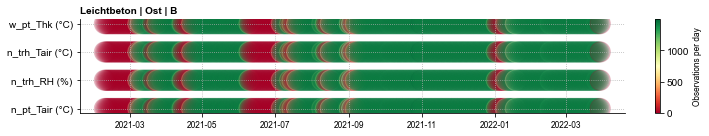

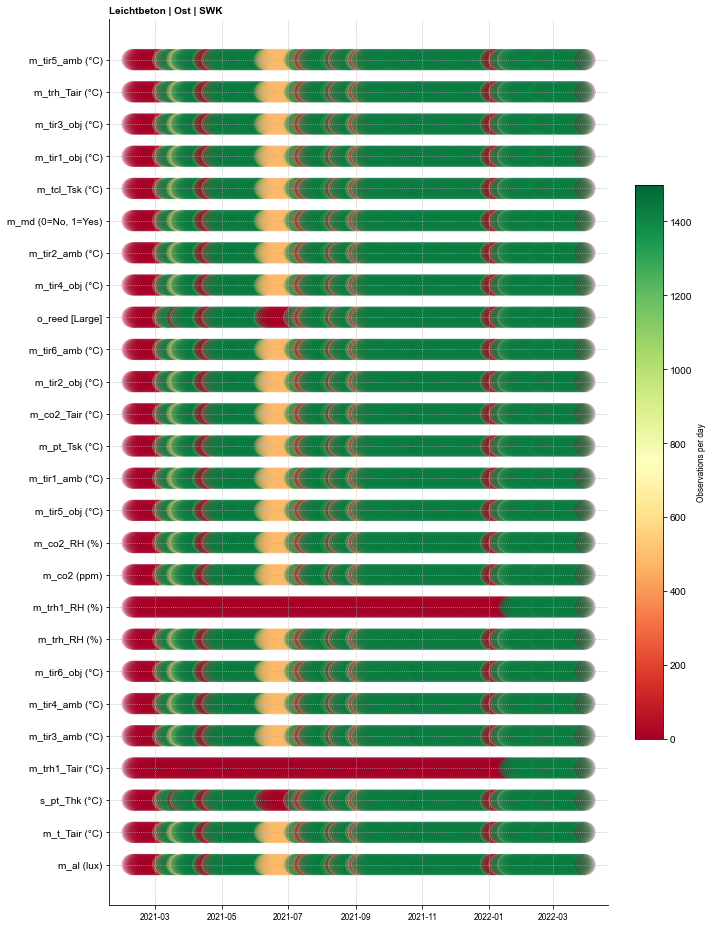

In [4]:
for bui in BUID:
    for app in WOHNUNGEN:
        df = IND[bui][app]
        df = df.resample('D').count()
        for name, df in df.groupby(level=0,axis=1):
                if name == '': name = 'Stromzähler'
                fig,ax = plt.subplots(figsize = (10,10))
                ax.set_title(f'{BUID[bui]} | {WOHNUNGEN[app]} | {name}')
                df = df.unstack().reset_index().set_index('Datetime')
                df.columns = ['Room','Sensor_ID', 'n_data']
                df = df.sort_values(by='Sensor_ID').sort_index()
                fig.set_figheight(df.Sensor_ID.unique().size*0.5)
                sc = ax.scatter(df.index, df.Sensor_ID, c=df.n_data, s=len(df.index.unique()), alpha=0.2,marker = 'o', cmap='RdYlGn')
                ax.get_xaxis()
                #ax.set_xlim(dt.datetime.now()-dt.timedelta(1000),dt.datetime.now())
                cbar = fig.colorbar(sc,fraction=.05)
                cbar.solids.set(alpha=1)
                cbar.set_label("Observations per day")
                fig.tight_layout()